In [1]:
!pip install lpips
!pip install torchvision


## Imports

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import torchvision.utils as vutils

import matplotlib.pyplot as plt
import numpy as np
import lpips

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using:", device)

Using: cuda


## CIFAR-10 DATASET

In [3]:
transform = transforms.Compose([transforms.ToTensor()])

train_data = datasets.CIFAR10(root="./data", train=True, download=True, transform=transform)
test_data  = datasets.CIFAR10(root="./data", train=False, download=True, transform=transform)

train_loader = DataLoader(train_data, batch_size=128, shuffle=True)
test_loader  = DataLoader(test_data, batch_size=64, shuffle=False)

## STRAIGHT-THROUGH BINARIZATION

In [4]:
class BinarizeSTE(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x):
        return (x > 0).float()

    @staticmethod
    def backward(ctx, grad_output):
        return grad_output

binarize = BinarizeSTE.apply


## BINARY AUTOENCODER

In [5]:
class BinaryAutoencoder(nn.Module):
    def __init__(self, latent_dim=1024, epsilon=1e-4):
        super().__init__()
        self.epsilon = epsilon

        self.encoder = nn.Sequential(
            nn.Conv2d(3,32,4,2,1), nn.ReLU(),
            nn.Conv2d(32,64,4,2,1), nn.ReLU(),
            nn.Conv2d(64,128,4,2,1), nn.ReLU(),
        )

        self.fc_enc = nn.Linear(128*4*4, latent_dim)
        self.fc_dec = nn.Linear(latent_dim, 128*4*4)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128,64,4,2,1), nn.ReLU(),
            nn.ConvTranspose2d(64,32,4,2,1), nn.ReLU(),
            nn.ConvTranspose2d(32,3,4,2,1), nn.Sigmoid(),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)
        z = torch.tanh(self.fc_enc(x))
        z = z + self.epsilon * torch.randn_like(z)
        z_bin = binarize(z)
        z_bin = z + (z_bin - z).detach()
        x = self.fc_dec(z_bin)
        x = x.view(-1, 128, 4, 4)
        x = self.decoder(x)
        return x, z_bin

## LPIPS LOSS

In [6]:
lpips_loss = lpips.LPIPS(net="alex").to(device)

def to_lpips_range(x):
    return x * 2 - 1

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth


## VISUALIZATION

In [7]:
def visualize(model):
    model.eval()
    imgs, _ = next(iter(test_loader))
    imgs = imgs.to(device)

    with torch.no_grad():
        recon, _ = model(imgs)

    fig, axs = plt.subplots(1, 2, figsize=(20,10))

    axs[0].imshow(vutils.make_grid(imgs[:32], normalize=True, nrow=8).permute(1,2,0).cpu())
    axs[0].set_title("Original")
    axs[0].axis("off")

    axs[1].imshow(vutils.make_grid(recon[:32], normalize=True, nrow=8).permute(1,2,0).cpu())
    axs[1].set_title("Reconstruction")
    axs[1].axis("off")

    plt.show()

## TRAINING LOOP

In [8]:
def train_lpips(epochs=1000, print_interval=20, vis_interval=100):
    model = BinaryAutoencoder().to(device)
    optimizer = optim.Adam(model.parameters(), lr=3e-4)
    epoch_losses = []

    for epoch in range(epochs):
        batch_losses = []

        for imgs, _ in train_loader:
            imgs = imgs.to(device)
            outputs, _ = model(imgs)

            loss = lpips_loss(
                to_lpips_range(outputs),
                to_lpips_range(imgs)
            ).mean()

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batch_losses.append(loss.item())

        epoch_loss = np.mean(batch_losses)
        epoch_losses.append(epoch_loss)

        # PRINT every 20 epochs
        if (epoch + 1) % print_interval == 0:
            print(f"Epoch {epoch+1}/{epochs} | LPIPS Loss: {epoch_loss:.6f}")

        # VISUALIZE every 100 epochs
        if (epoch + 1) % vis_interval == 0:
            print(f"\n--- Visualization at Epoch {epoch+1} ---")
            visualize(model)

    return model, epoch_losses


## LPIPS EVALUATION

In [9]:
def evaluate(model):
    total = 0
    count = 0

    with torch.no_grad():
        for imgs, _ in test_loader:
            imgs = imgs.to(device)
            recon, _ = model(imgs)
            total += lpips_loss(to_lpips_range(recon), to_lpips_range(imgs)).mean().item()
            count += 1

    return total / count

## MAIN EXECUTION

Epoch 20/1000 | LPIPS Loss: 0.024273
Epoch 40/1000 | LPIPS Loss: 0.015823
Epoch 60/1000 | LPIPS Loss: 0.012418
Epoch 80/1000 | LPIPS Loss: 0.010626
Epoch 100/1000 | LPIPS Loss: 0.009559

--- Visualization at Epoch 100 ---


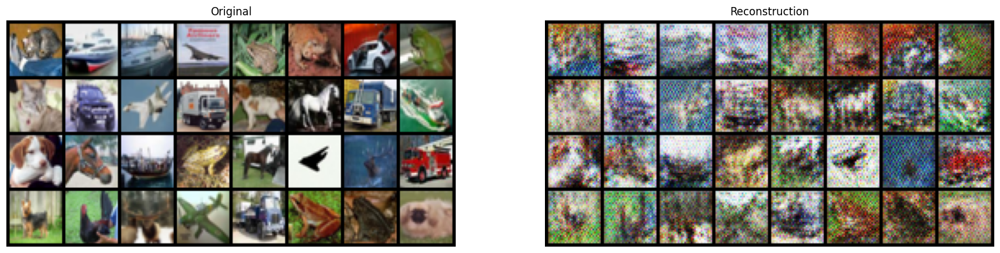

Epoch 120/1000 | LPIPS Loss: 0.008819
Epoch 140/1000 | LPIPS Loss: 0.008286
Epoch 160/1000 | LPIPS Loss: 0.007878
Epoch 180/1000 | LPIPS Loss: 0.007507
Epoch 200/1000 | LPIPS Loss: 0.007280

--- Visualization at Epoch 200 ---


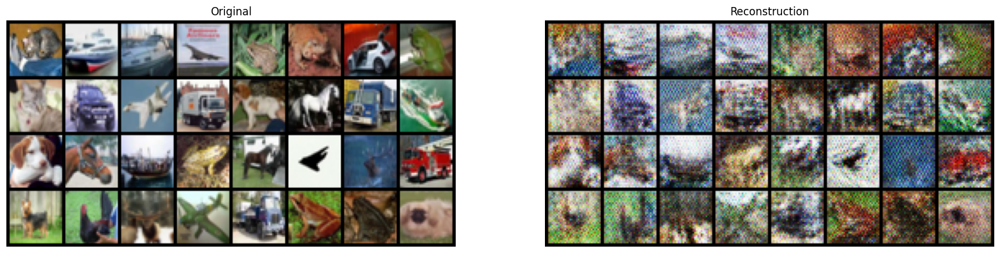

Epoch 220/1000 | LPIPS Loss: 0.007061
Epoch 240/1000 | LPIPS Loss: 0.006856
Epoch 260/1000 | LPIPS Loss: 0.006646
Epoch 280/1000 | LPIPS Loss: 0.006498
Epoch 300/1000 | LPIPS Loss: 0.006379

--- Visualization at Epoch 300 ---


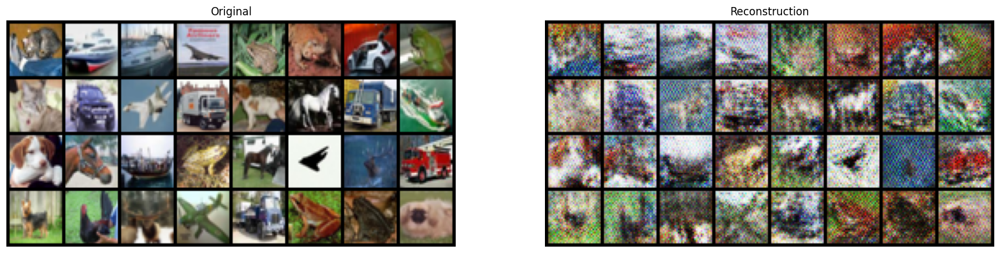

Epoch 320/1000 | LPIPS Loss: 0.006264
Epoch 340/1000 | LPIPS Loss: 0.006156
Epoch 360/1000 | LPIPS Loss: 0.006048
Epoch 380/1000 | LPIPS Loss: 0.005955
Epoch 400/1000 | LPIPS Loss: 0.005849

--- Visualization at Epoch 400 ---


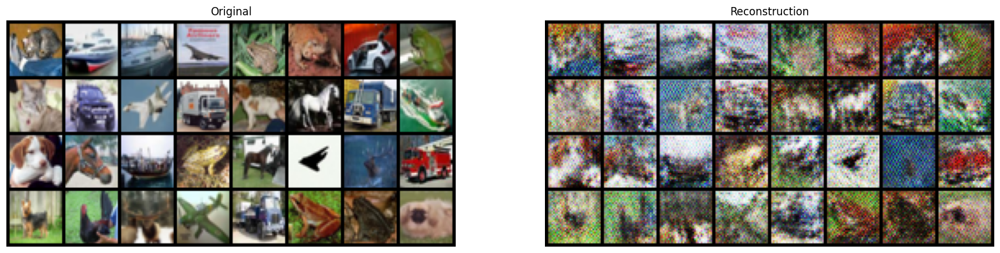

Epoch 420/1000 | LPIPS Loss: 0.005794
Epoch 440/1000 | LPIPS Loss: 0.005707
Epoch 460/1000 | LPIPS Loss: 0.005649
Epoch 480/1000 | LPIPS Loss: 0.005567
Epoch 500/1000 | LPIPS Loss: 0.005490

--- Visualization at Epoch 500 ---


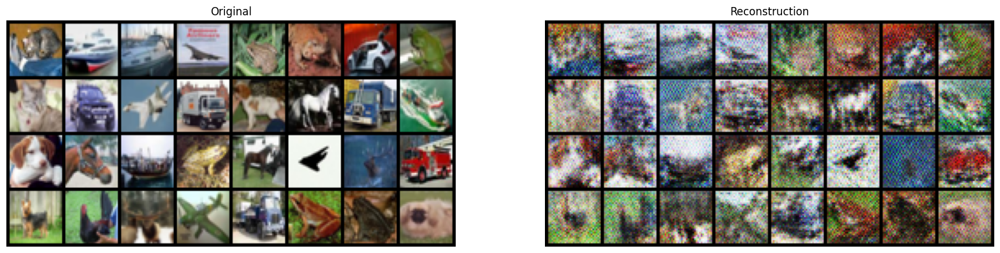

Epoch 520/1000 | LPIPS Loss: 0.005440
Epoch 540/1000 | LPIPS Loss: 0.005388
Epoch 560/1000 | LPIPS Loss: 0.005322
Epoch 580/1000 | LPIPS Loss: 0.005271
Epoch 600/1000 | LPIPS Loss: 0.005231

--- Visualization at Epoch 600 ---


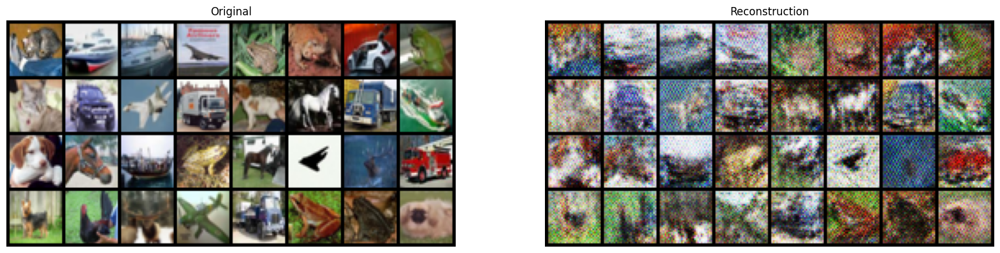

Epoch 620/1000 | LPIPS Loss: 0.005185
Epoch 640/1000 | LPIPS Loss: 0.005120
Epoch 660/1000 | LPIPS Loss: 0.005058
Epoch 680/1000 | LPIPS Loss: 0.005035
Epoch 700/1000 | LPIPS Loss: 0.004995

--- Visualization at Epoch 700 ---


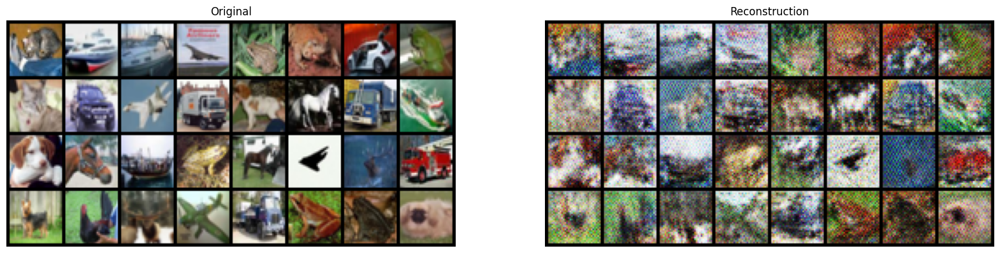

Epoch 720/1000 | LPIPS Loss: 0.004983
Epoch 740/1000 | LPIPS Loss: 0.004943
Epoch 760/1000 | LPIPS Loss: 0.004864
Epoch 780/1000 | LPIPS Loss: 0.004863
Epoch 800/1000 | LPIPS Loss: 0.004830

--- Visualization at Epoch 800 ---


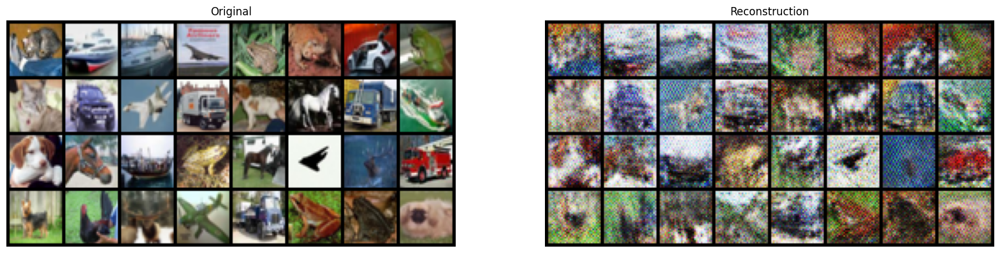

Epoch 820/1000 | LPIPS Loss: 0.004785
Epoch 840/1000 | LPIPS Loss: 0.004729
Epoch 860/1000 | LPIPS Loss: 0.004726
Epoch 880/1000 | LPIPS Loss: 0.004712
Epoch 900/1000 | LPIPS Loss: 0.004669

--- Visualization at Epoch 900 ---


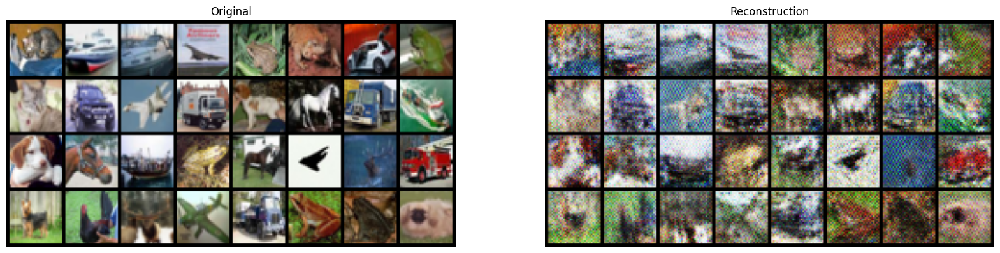

Epoch 920/1000 | LPIPS Loss: 0.004658
Epoch 940/1000 | LPIPS Loss: 0.004623
Epoch 960/1000 | LPIPS Loss: 0.004559
Epoch 980/1000 | LPIPS Loss: 0.004556
Epoch 1000/1000 | LPIPS Loss: 0.004547

--- Visualization at Epoch 1000 ---


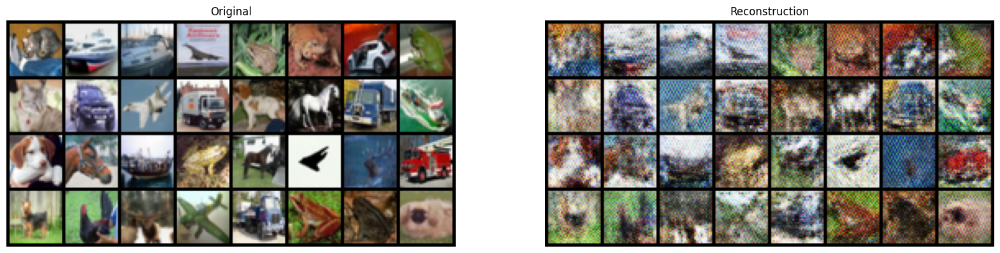

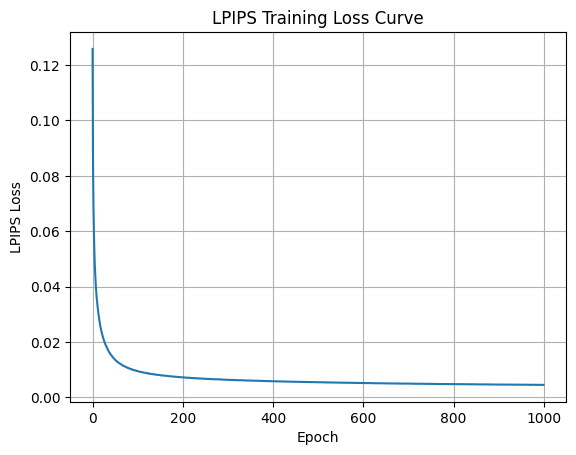


Final Reconstruction:


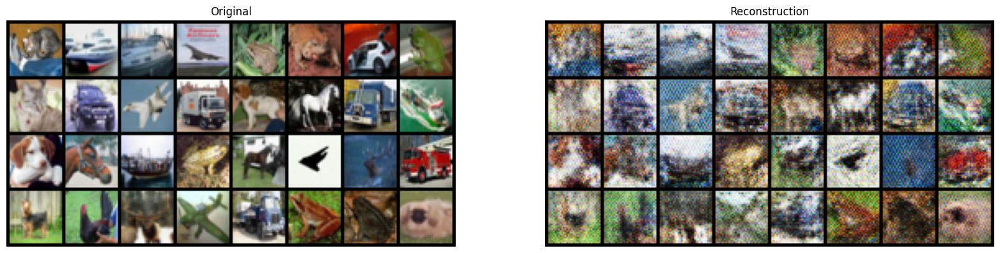


Final LPIPS Score: 0.017873389195579632


In [11]:
model, loss_curve = train_lpips(epochs=1000, print_interval=20, vis_interval=100)

plt.plot(loss_curve)
plt.title("LPIPS Training Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("LPIPS Loss")
plt.grid()
plt.show()

print("\nFinal Reconstruction:")
visualize(model)

score = evaluate(model)
print("\nFinal LPIPS Score:", score)